[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Automatic Detection of 3-Second Violations in Basketball

---

## Before you start

### Configure your API key

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy` to copy your private API key to the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑).
    - Store your Roboflow API key under the name `ROBOFLOW_API_KEY`.

In [ ]:
import os
from google.colab import userdata

os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

### Select the runtime

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Tue Jul 22 16:19:02 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   65C    P8             15W /   72W |       0MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


### Install dependencies

**Note:** Install the `inference-gpu` library, along with `gdown` for downloading files. This setup allows you to efficiently run object detection and keypoint detection models on GPUs.

In [ ]:
!pip install -q gdown inference-gpu

**Note:** Set the ONNX Runtime execution provider to CUDA to ensure model inference runs on the GPU.

In [ ]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

**Note:** Clone and install the SAM2 fork, which will be used for player segmentation and tracking. Installation may take a few minutes to complete, so please be patient.


In [ ]:
!git clone https://github.com/Gy920/segment-anything-2-real-time.git $HOME/segment-anything-2-real-time
%cd $HOME/segment-anything-2-real-time
!pip install -e . -q
!python setup.py build_ext --inplace

**NOTE:** SAM2 is available in 4 different model sizes ranging from the lightweight "sam2_hiera_tiny" (38.9M parameters) to the more powerful "sam2_hiera_large" (224.4M parameters).

In [ ]:
!cd $HOME/segment-anything-2-real-time/checkpoints && bash download_ckpts.sh

**Note:** Install the latest development version of the `roboflow-sports` package (basketball radar feature branch) to access basketball court utilities.

In [ ]:
!pip install git+https://github.com/roboflow/sports.git@feat/basketball_radar

### Download the sample data

**Note:** Download the sample video file using `gdown`. This file will be used for testing player detection and tracking.

In [ ]:
!cd $HOME && gdown https://drive.google.com/uc?id=1EsxiyaYGj3FeXSXoK51pre5OjVGWTCSE

Downloading...
From: https://drive.google.com/uc?id=1EsxiyaYGj3FeXSXoK51pre5OjVGWTCSE
To: /content/boston-celtics-new-york-knicks-game-4-q1-05.06-05.01.mp4
100% 6.61M/6.61M [00:00<00:00, 17.4MB/s]


In [ ]:
SOURCE_VIDEO_PATH = f"{HOME}/boston-celtics-new-york-knicks-game-4-q1-05.06-05.01.mp4"

## ball, number, player, referee and basket detection

In [ ]:
from inference import get_model
from google.colab import userdata
import supervision as sv

PLAYER_DETECTION_MODEL_ID = "basketball-player-detection-2/12"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key =  userdata.get("ROBOFLOW_API_KEY"))

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

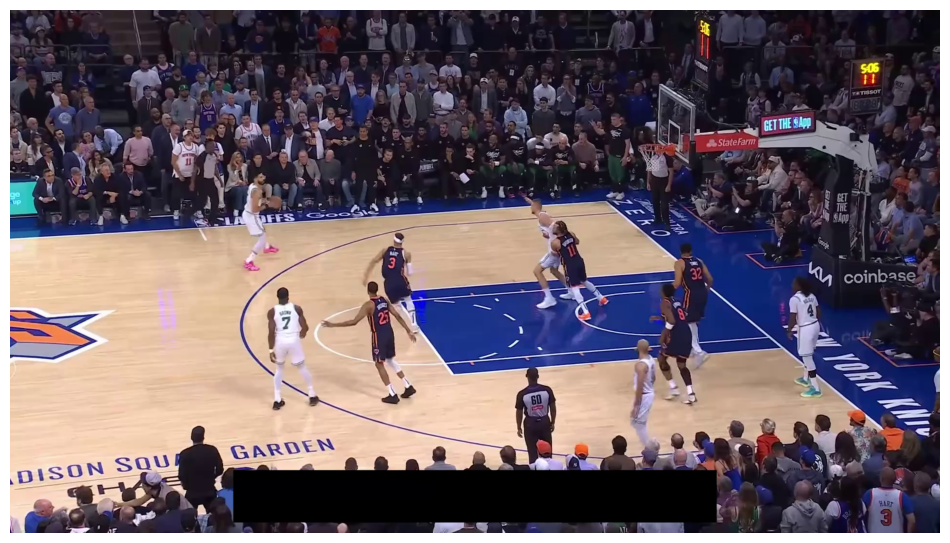

In [ ]:

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

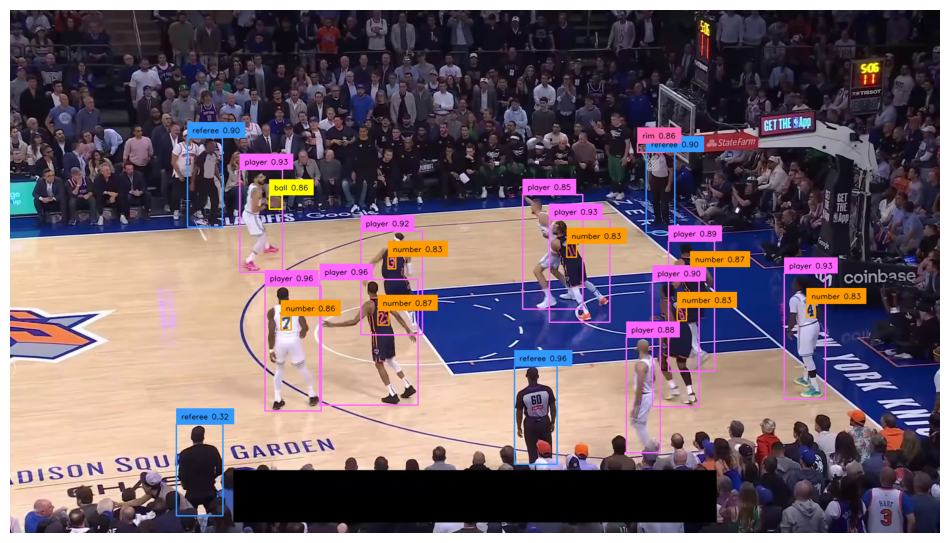

In [ ]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels)

sv.plot_image(annotated_frame)

## detect players

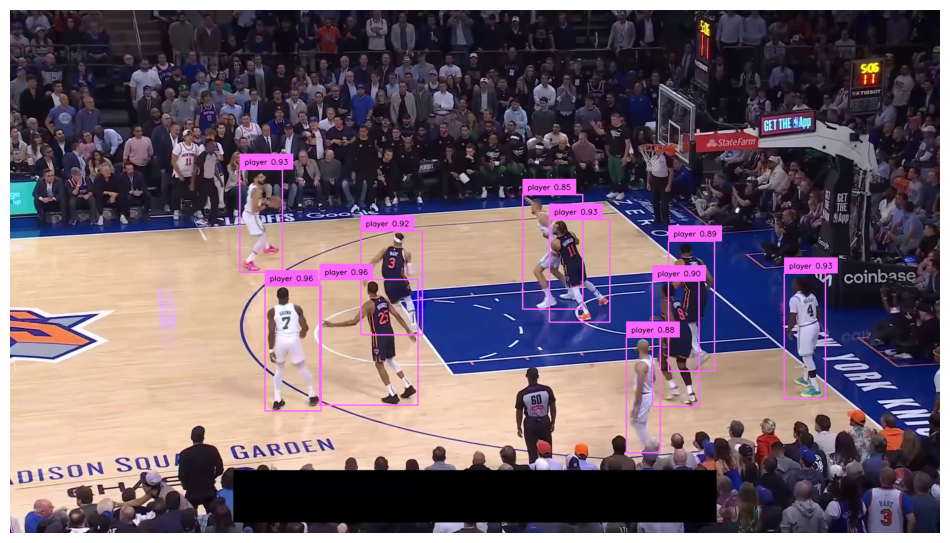

In [ ]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)
detections = detections[detections.class_id == 2]

labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels)

sv.plot_image(annotated_frame)

## detect basketball court keypoints

In [ ]:
from inference import get_model
from google.colab import userdata

COURT_DETECTION_MODEL_ID = "basketball-court-detection-2/10"
COURT_DETECTION_MODEL = get_model(model_id=COURT_DETECTION_MODEL_ID, api_key =  userdata.get("ROBOFLOW_API_KEY"))

MAGENTA_COLOR = sv.Color.from_hex('#FF1493')
CYAN_COLOR = sv.Color.from_hex('#00BFFF')

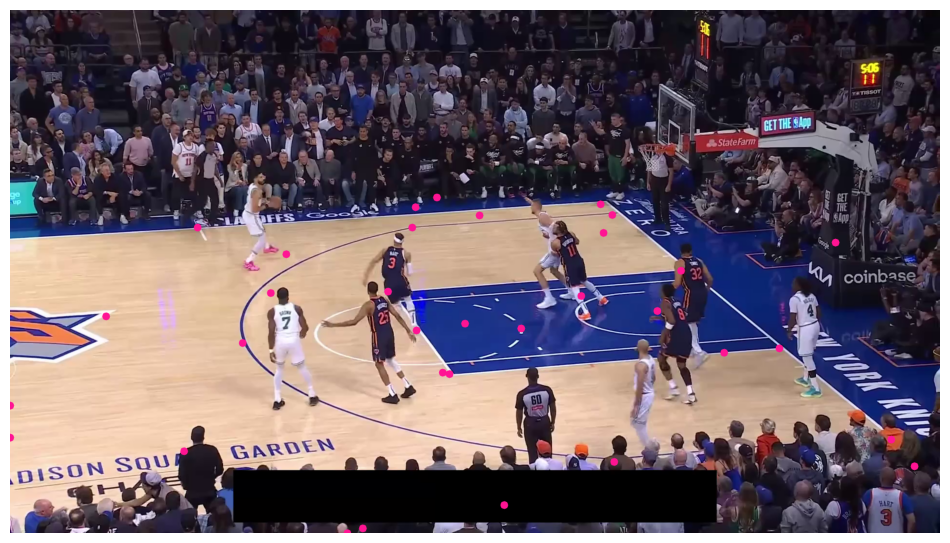

In [ ]:
vertex_annotator = sv.VertexAnnotator(color=MAGENTA_COLOR, radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = COURT_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)

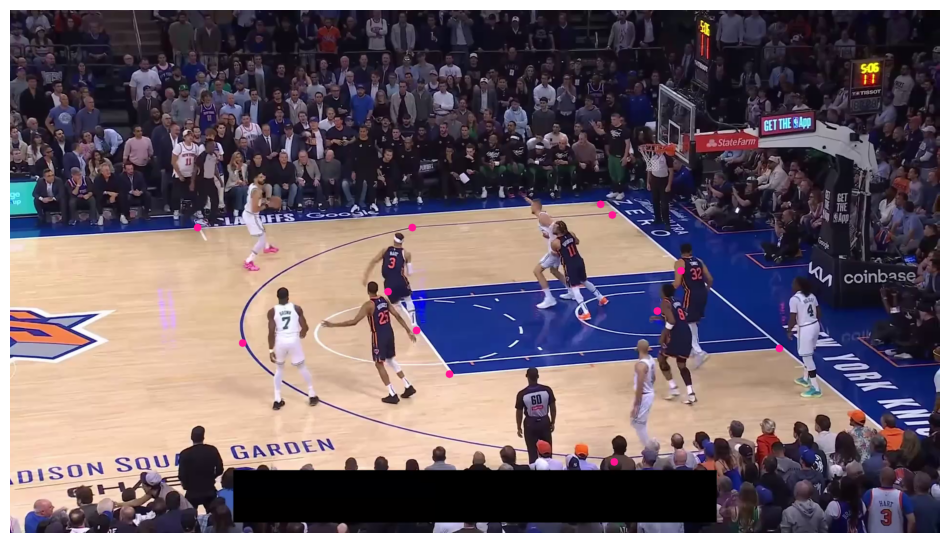

In [ ]:
vertex_annotator = sv.VertexAnnotator(color=MAGENTA_COLOR, radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = COURT_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## project lines and missing points

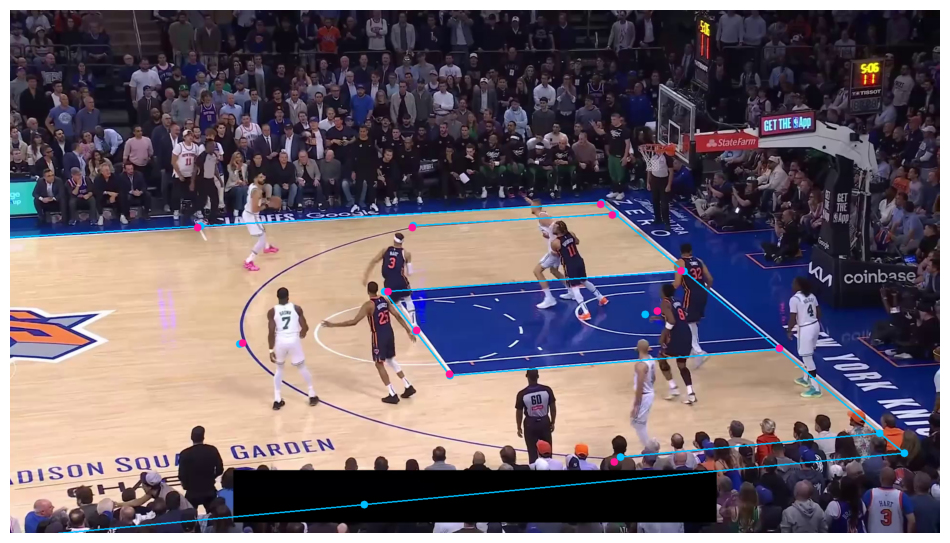

In [ ]:
from sports.common.view import ViewTransformer
from sports.configs.basketball import BasketballCourtConfiguration

CONFIG = BasketballCourtConfiguration()

vertex_annotator = sv.VertexAnnotator(color=MAGENTA_COLOR, radius=8)
vertex_annotator_2 = sv.VertexAnnotator(color=CYAN_COLOR, radius=8)

edge_annotator = sv.EdgeAnnotator(
    color=CYAN_COLOR,
    thickness=2,
    edges=[(p1 + 1, p2 + 1) for p1, p2 in CONFIG.edges]
)


frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = COURT_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

court_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=court_reference_points,
    target=frame_reference_points
)

court_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=court_all_points)

frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator_2.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## detect the paint

In [ ]:
def polygon_to_mask(polygon: np.ndarray, frame_shape: tuple) -> np.ndarray:
    """
    Generates a binary mask from a polygon over a frame.

    Parameters:
    - polygon: np.ndarray of shape (N, 2), where N is the number of vertices (x, y)
    - frame_shape: tuple (height, width) of the frame

    Returns:
    - mask: np.ndarray of shape (height, width), dtype=bool
    """

    height, width = frame_shape
    mask = np.zeros((height, width), dtype=np.uint8)

    # Ensure polygon is in the format OpenCV expects
    polygon_int = polygon.astype(np.int32).reshape((-1, 1, 2))

    cv2.fillPoly(mask, [polygon_int], color=1)
    return mask.astype(bool)

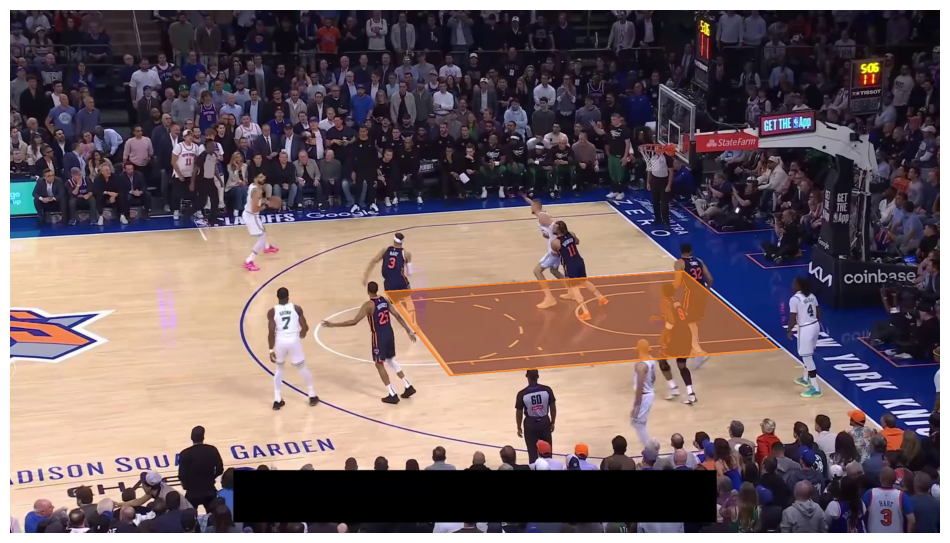

In [ ]:
from sports.common.view import ViewTransformer
from sports.configs.basketball import BasketballCourtConfiguration

CONFIG = BasketballCourtConfiguration()
left_paint = [2, 9, 10, 11, 3, 2] # Indices to keypoint list
right_paint = [21, 23, 30, 29] # Indices to keypoint list
COLORS_ZONE = sv.ColorPalette.from_hex(["#F58426",])
KEYPOINT_CONFIDENCE_THRESHOLD = 0.5
zone_annotator = sv.MaskAnnotator(color=COLORS_ZONE.by_idx(0), opacity=0.6, color_lookup=sv.ColorLookup.INDEX)
vertex_annotator = sv.VertexAnnotator(color=MAGENTA_COLOR, radius=8)
vertex_annotator_2 = sv.VertexAnnotator(color=CYAN_COLOR, radius=8)

edge_annotator = sv.EdgeAnnotator(
    color=CYAN_COLOR,
    thickness=2,
    edges=[(p1 + 1, p2 + 1) for p1, p2 in CONFIG.edges]
)


frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = COURT_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

court_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=court_reference_points,
    target=frame_reference_points
)

court_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=court_all_points)

frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

paint_zone = None

polygons_indices = [left_paint,right_paint]

mask = key_points.confidence[0]<KEYPOINT_CONFIDENCE_THRESHOLD
filter = ~mask
key_points.xy[0][mask] = key_points.xy[0][mask] * 0

for i,indices in enumerate(polygons_indices):
    if np.count_nonzero(key_points.xy[0][indices])  < 5 : #there arent at least 2 keypoints
        continue


    polygon = frame_all_key_points.xy[0][indices]
    paint = frame_all_points[indices].astype(int)

    polygon[polygon== 0] = paint[polygon== 0]
    paint_zone = sv.PolygonZone(
      polygon=polygon,
      triggering_anchors=(sv.Position.BOTTOM_CENTER,)
      )


annotated_frame = frame.copy()

zone_mask = polygon_to_mask(paint_zone.polygon, frame.shape[:2])
zone_xyxy = sv.mask_to_xyxy(masks=np.array([zone_mask]))

# Annotate the zone
annotated_frame = zone_annotator.annotate(
    scene=annotated_frame, detections=sv.Detections(xyxy=zone_xyxy,
                                                    mask=np.array([zone_mask]),
                                                    class_id = np.array([0])))
# Draw zone polygon outline
annotated_frame = sv.draw_polygon(
    scene=annotated_frame, polygon=paint_zone.polygon, color=COLORS_ZONE.by_idx(0)
)
sv.plot_image(annotated_frame)

## track end segment the players

In [ ]:
%cd $HOME/segment-anything-2-real-time

/content/segment-anything-2-real-time


In [ ]:
from sam2.build_sam import build_sam2_camera_predictor

SAM2_CHECKPOINT = "checkpoints/sam2.1_hiera_large.pt"
SAM2_CONFIG = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_camera_predictor(SAM2_CONFIG, SAM2_CHECKPOINT)

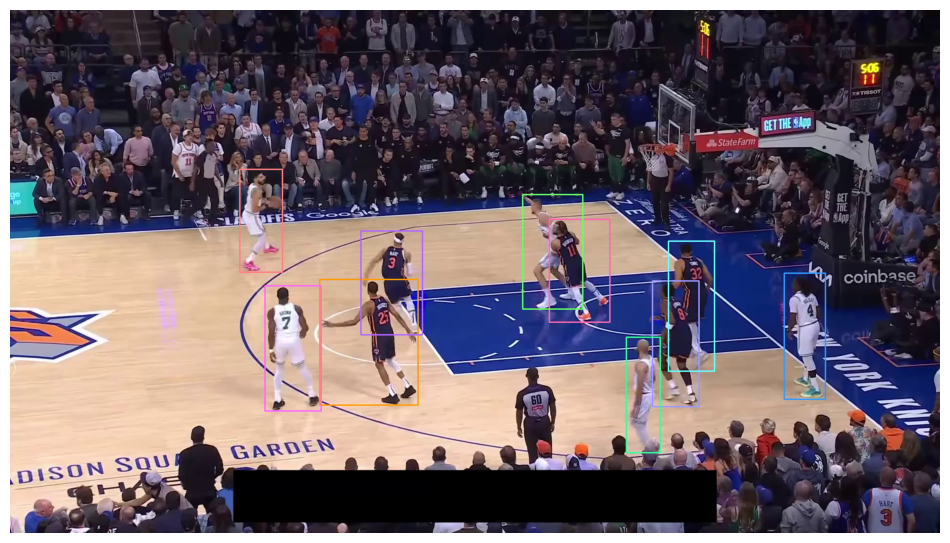

147it [01:01,  2.38it/s]


In [ ]:
import cv2
import torch
from tqdm import tqdm

PLAYER_ID = 2
CONFIDENCE_THRESHOLD = 0.3
IOU_THRESHOLD = 0.7
INTERVAL = 30

mask_annotator = sv.MaskAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    opacity=0.7)
box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)

annotated_frames = []

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=CONFIDENCE_THRESHOLD, iou_threshold=IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[detections.class_id == PLAYER_ID]

XYXY = detections.xyxy
CLASS_ID = detections.class_id
TRACKE_ID = list(range(1, len(CLASS_ID) + 1))

detections = sv.Detections(
    xyxy=XYXY,
    tracker_id=np.array(TRACKE_ID)
)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
sv.plot_image(annotated_frame)

with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.load_first_frame(frame)

    for xyxy, tracker_id in zip(XYXY, TRACKE_ID):
        xyxy = np.array([xyxy])

        _, object_ids, mask_logits = predictor.add_new_prompt(
            frame_idx=0,
            obj_id=tracker_id,
            bbox=xyxy
        )

for index, frame in tqdm(enumerate(frame_generator)):

    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
        tracker_ids, mask_logits = predictor.track(frame)
        tracker_ids = np.array(tracker_ids)
        masks = (mask_logits > 0.0).cpu().numpy()
        masks = np.squeeze(masks).astype(bool)

        detections = sv.Detections(
            xyxy=sv.mask_to_xyxy(masks=masks),
            mask=masks,
            tracker_id=tracker_ids
        )

    if index % INTERVAL == 0:

        annotated_frame = frame.copy()
        annotated_frame = mask_annotator.annotate(scene=annotated_frame, detections=detections)
        annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
        annotated_frames.append(annotated_frame)

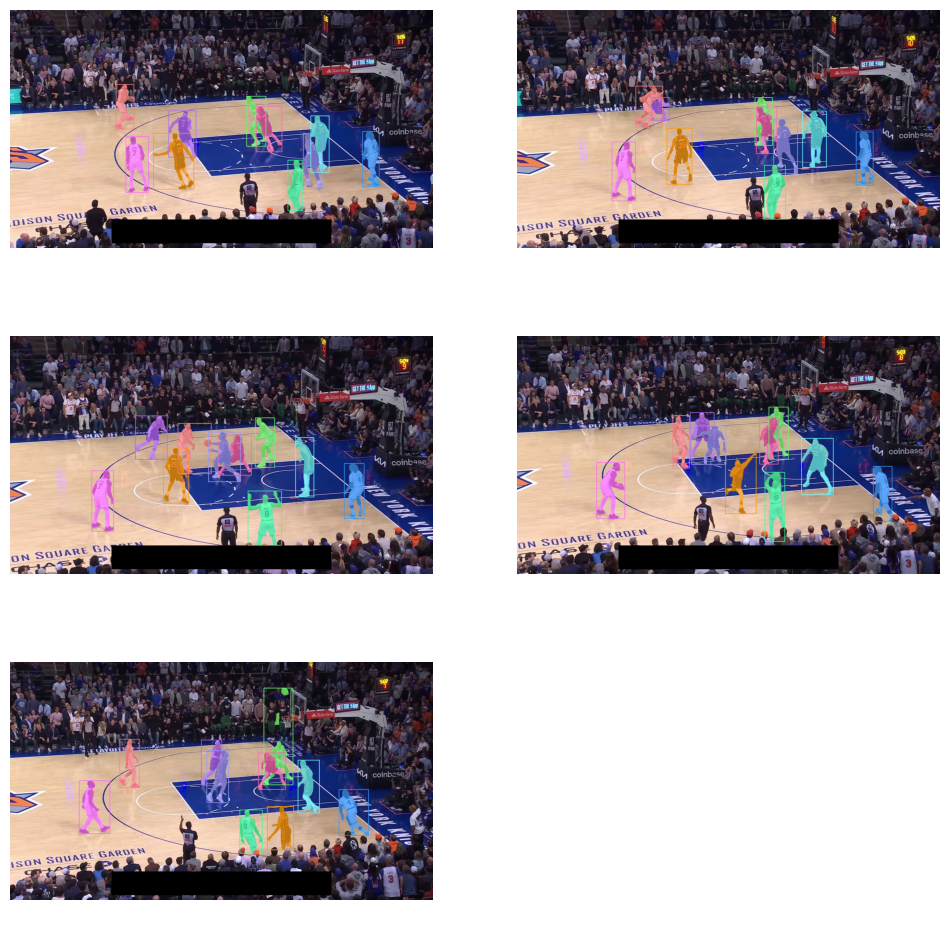

In [ ]:
sv.plot_images_grid(
    images=annotated_frames[:6],
    grid_size=(3, 2)
)

## clean noisy masks

In [ ]:
import numpy.typing as npt
import numpy as np
def remove_noisy_segments(
    mask: npt.NDArray[np.bool_],
    connectivity: int = 8,
    area_threshold: int = 700,
    distance_threshold: float = 70.0,
) -> npt.NDArray[np.bool_]:
    """
    Removes connected components small and spatially distant from the largest connected component
    out of a binary mask. Component area is penalized more the farther it is from the largest component centroid,
    removing larger components that are far away from the threshold.

    Args:
        mask (npt.NDArray[np.bool_]): A 2D boolean or binary mask, where 0 indicates background
            and 1 indicates foreground.
        connectivity (int): Connectivity for connected components analysis. Can either be 4 or 8, default is 8.
            When the value is 4, each pixel connects only to its horizontal and vertical neighbors:
              Up, Down, Left, Right.
            When the value is 8, each pixel connects to its horizontal, vertical, and diagonal neighbors,
              being more permisive to what is considered a connected component.
        area_threshold (int): Minimum area in pixels required to keep a non largest component.
            If the component's area is smaller than this value, it will be considered for the
            distance evaluation. When the component is farther than the 'distance_threshold'
            parameter, the area threshold is scaled up linearly with the distance from the
            main component's centroid, so that larger components are removed when distance grows.
        distance_threshold (float): Maximum distance in pixels from the main component's centroid
            to keep a component.
            If the distance from the main component's centroid is larger than this value, then
            the algorithm will check the area and if it is smaller than the 'area_threshold',
            the component will be considered an outlier and removed.
            Distance is calculated as the Euclidean distance between the component's centroid and the main
            component's centroid.

    Returns:
        np.ndarray: A cleaned binary mask with outlier components removed.

        ```python
        import numpy as np
        import supervision as sv

        mask = np.array([
            [1, 1, 1, 1, 0, 0],
            [0, 0, 0, 0, 0, 0],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 1, 0, 1, 1],
            [0, 0, 0, 0, 0, 0],
            [0, 1, 1, 1, 0, 0],
            [0, 1, 1, 1, 0, 0]
        ]).astype(bool)

        sv.remove_noisy_segments(mask=mask, connectivity=4, area_threshold = 4, distance_threshold = 4)
        # np.array([
        #     [0, 0, 0, 0, 0, 0],
        #     [0, 0, 0, 0, 0, 0],
        #     [1, 0, 0, 0, 1, 1],
        #     [0, 1, 1, 0, 1, 1],
        #     [0, 0, 0, 0, 0, 0],
        #     [0, 1, 1, 1, 0, 0],
        #     [0, 1, 1, 1, 0, 0]
        # ])

    """
    if connectivity != 4 and connectivity != 8:
        raise ValueError(
            "Incorrect connectivity value. Possible connectivity values: 4 or 8."
        )
    mask_uint8 = (mask > 0).astype(np.uint8)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
        mask_uint8, connectivity=connectivity
    )

    if num_labels <= 1:
        return np.zeros_like(mask, dtype=bool)

    # Identify main (largest) component excluding background (label 0)
    areas = stats[1:, cv2.CC_STAT_AREA]

    if not areas.size:
        # input mask contains no foreground pixels
        return np.zeros_like(mask, dtype=bool)
    largest_idx = 1 + np.argmax(areas)
    main_centroid = centroids[largest_idx]

    # Start with an empty output mask
    cleaned_mask = np.zeros_like(mask, dtype=bool)
    for i in range(1, num_labels):  # skip background
        area = stats[i, cv2.CC_STAT_AREA]
        centroid = centroids[i]

        dist = np.linalg.norm(centroid - main_centroid)

        # Increase area threshold proportionally with distance from main component
        if (
            dist > distance_threshold
            and area < area_threshold * dist / distance_threshold
        ):
            continue

        # Keep component
        cleaned_mask[labels == i] = True

    return cleaned_mask

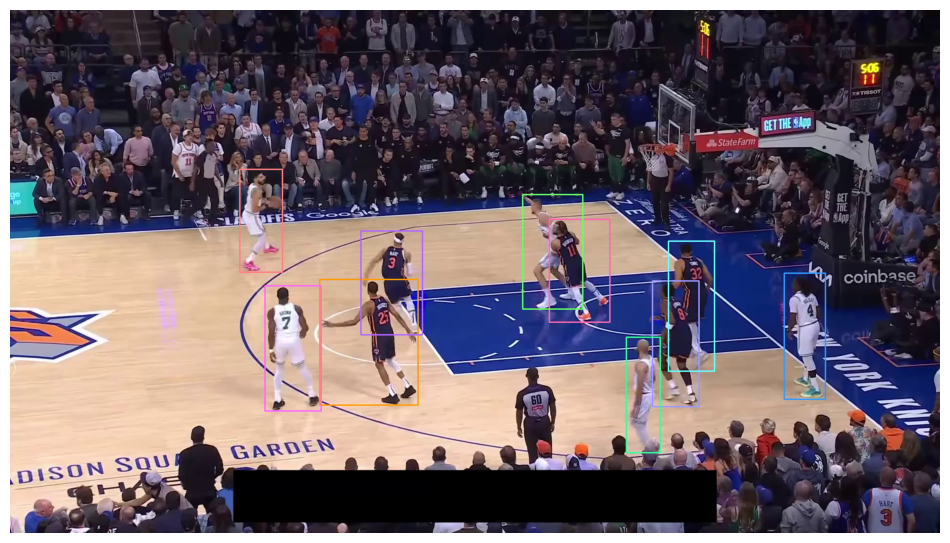

147it [01:18,  1.88it/s]


In [ ]:
import cv2
import torch
from tqdm import tqdm

PLAYER_ID = 2
CONFIDENCE_THRESHOLD = 0.3
IOU_THRESHOLD = 0.7
INTERVAL = 30

mask_annotator = sv.MaskAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    opacity=0.7)
box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)

annotated_frames_before = []

annotated_frames_after = []

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=CONFIDENCE_THRESHOLD, iou_threshold=IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[detections.class_id == PLAYER_ID]

XYXY = detections.xyxy
CLASS_ID = detections.class_id
TRACKER_ID = list(range(1, len(CLASS_ID) + 1))

detections = sv.Detections(
    xyxy=XYXY,
    tracker_id=np.array(TRACKER_ID)
)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
sv.plot_image(annotated_frame)

with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.load_first_frame(frame)

    for xyxy, tracker_id in zip(XYXY, TRACKER_ID):
        xyxy = np.array([xyxy])

        _, object_ids, mask_logits = predictor.add_new_prompt(
            frame_idx=0,
            obj_id=tracker_id,
            bbox=xyxy
        )

for index, frame in tqdm(enumerate(frame_generator)):

    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
        tracker_ids, mask_logits = predictor.track(frame)
        tracker_ids = np.array(tracker_ids)
        masks = (mask_logits > 0.0).cpu().numpy()
        masks = np.squeeze(masks).astype(bool)
        masks_cleaned = np.array([
                    remove_noisy_segments(mask) for mask in masks
                ])
        detections_before = sv.Detections(
            xyxy=sv.mask_to_xyxy(masks=masks),
            mask=masks,
            tracker_id=tracker_ids
        )
        detections_after = sv.Detections(
            xyxy=sv.mask_to_xyxy(masks=masks_cleaned),
            mask=masks_cleaned,
            tracker_id=tracker_ids
        )
    if index % INTERVAL == 0:

        annotated_frame = frame.copy()
        annotated_frame_after = mask_annotator.annotate(scene=annotated_frame.copy(), detections=detections_after)

        annotated_frame_before = mask_annotator.annotate(scene=annotated_frame.copy(), detections=detections_before)
        annotated_frames_after.append(annotated_frame_after)
        annotated_frames_before.append(annotated_frame_before)

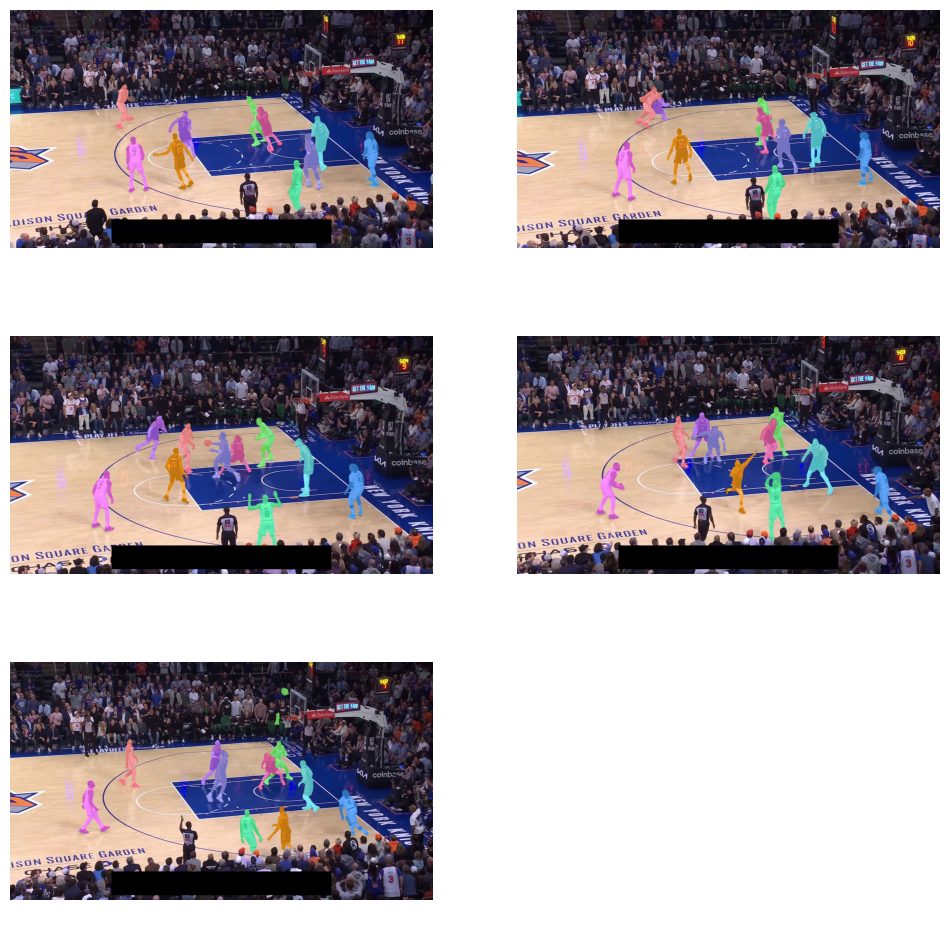

In [ ]:
sv.plot_images_grid(
    images=annotated_frames_before[:6],
    grid_size=(3, 2)
)

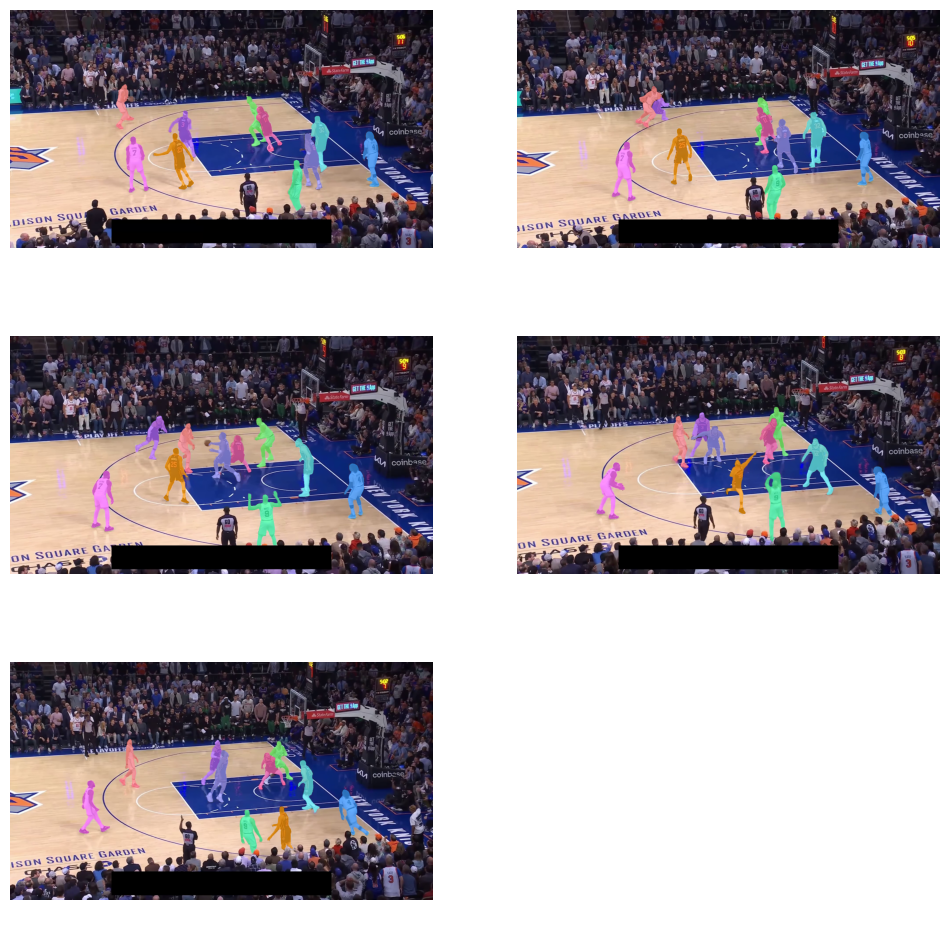

In [ ]:
sv.plot_images_grid(
    images=annotated_frames_after[:6],
    grid_size=(3, 2)
)

## detect players skeletons

In [ ]:
!pip install ultralytics

In [ ]:
from tqdm import tqdm
from ultralytics import YOLO
import cv2

from copy import deepcopy
from typing import List, Dict
from collections import deque

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
CUSTOM_12_VERTEX_SKELETON_EDGES = CUSTOM_12_VERTEX_SKELETON_EDGES = [
    [11, 9],
    [9, 7],
    [12, 10],
    [10, 8],
    [7, 8],
    [1, 7],
    [2, 8],
    [1, 2],
    [1, 3],
    [2, 4],
    [3, 5],
    [4, 6],
]
def plot_poses(players_keypoints: dict, frame):
    for tracker_id in players_keypoints.keys():
        new_kp_obj = sv.KeyPoints(xy=players_keypoints[tracker_id].xy[:, 5:], confidence=players_keypoints[tracker_id].confidence[:, 5:])
        annotator = sv.EdgeAnnotator(color=COLOR.by_idx(tracker_id), thickness=5,
                                     edges=CUSTOM_12_VERTEX_SKELETON_EDGES)
        frame = annotator.annotate(scene=frame, key_points=new_kp_obj)

    return frame

def plot_ankles(smoothed_ankles, frame):
    for tracker_id in smoothed_ankles.keys():
        if smoothed_ankles and smoothed_ankles[tracker_id]:
            smoothed_kp_obj = sv.KeyPoints(xy=np.array([smoothed_ankles[tracker_id][0], smoothed_ankles[tracker_id][1]])[np.newaxis, ...])
            vertex_label_annotator = sv.VertexLabelAnnotator(
                color=COLOR.by_idx(tracker_id),
                text_color=sv.Color.BLACK,
                border_radius=2
            )
            frame = vertex_label_annotator.annotate(
                scene=frame,
                key_points=smoothed_kp_obj,
                labels=["L", "R"]
            )
    return frame

0it [00:00, ?it/s]

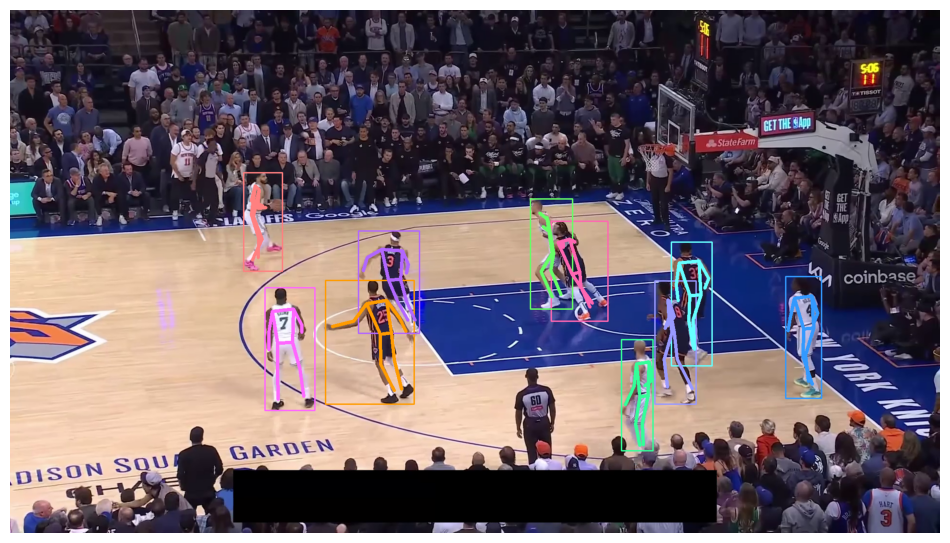

30it [00:13,  2.34it/s]

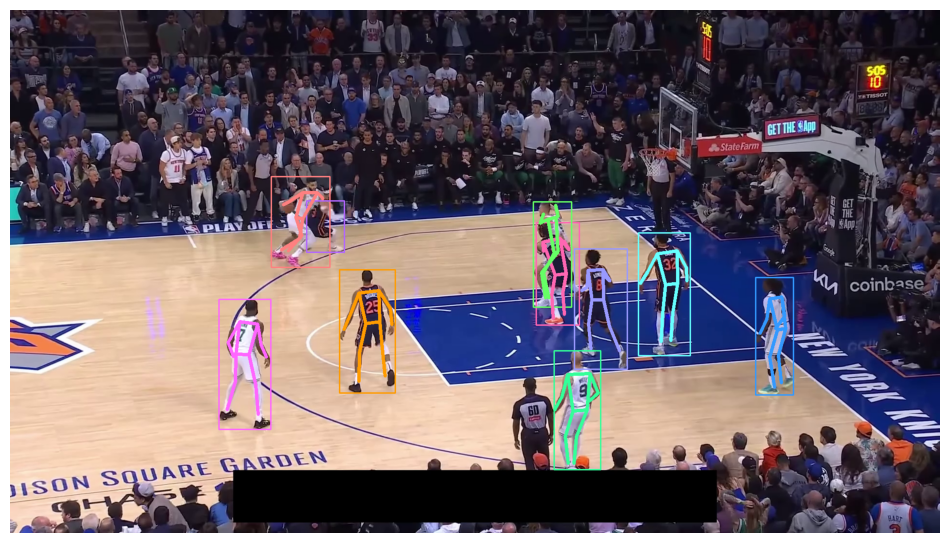

60it [00:26,  2.33it/s]

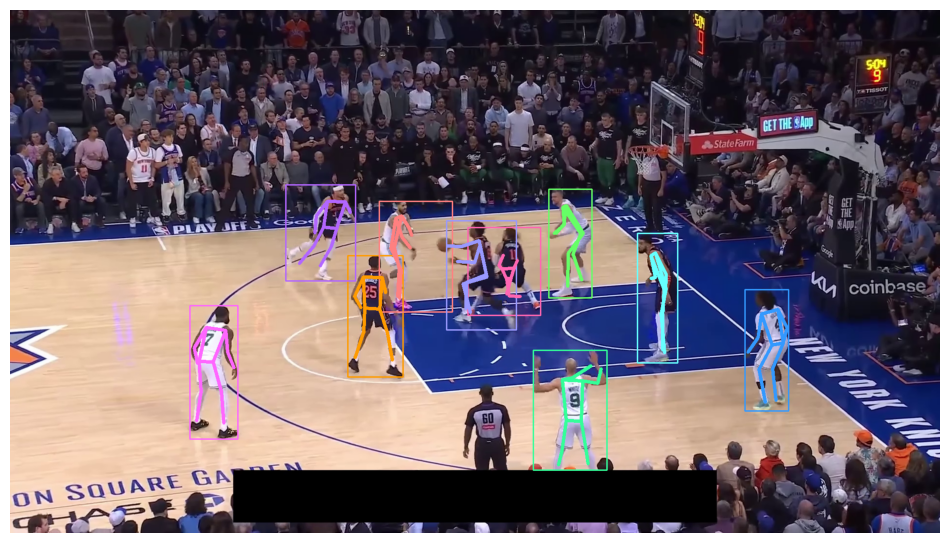

90it [00:39,  2.36it/s]

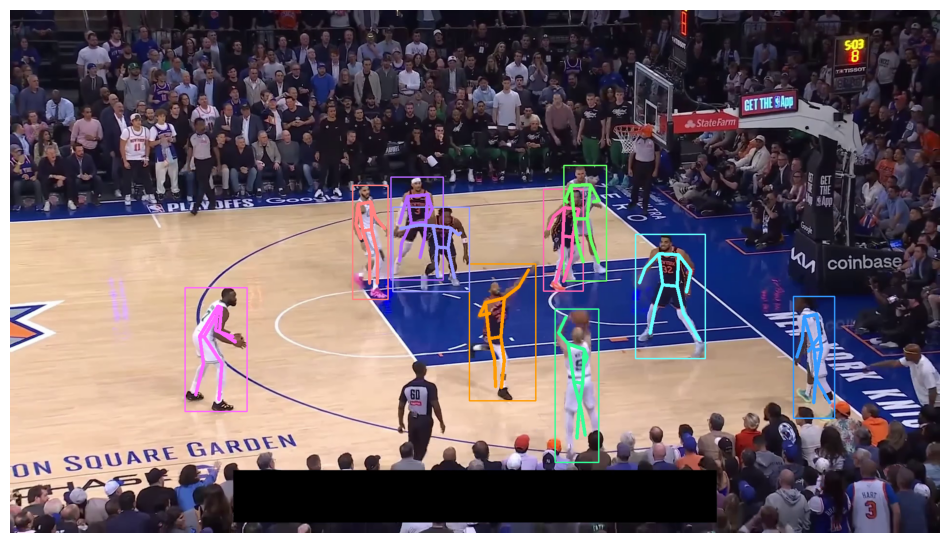

120it [00:53,  2.37it/s]

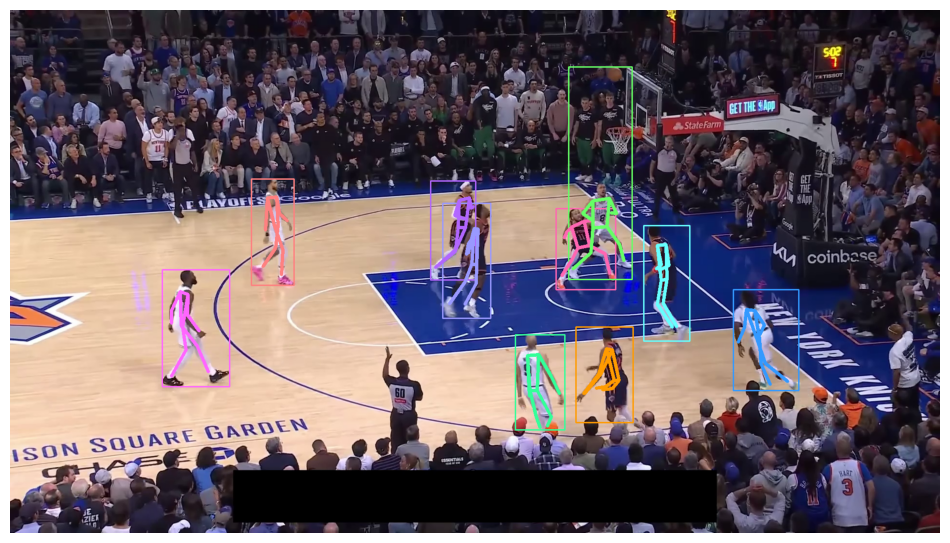

147it [01:05,  2.26it/s]


In [ ]:
POSE_MODEL = YOLO("yolo11l-pose.pt")
PLAYER_ID = 2
CONFIDENCE_THRESHOLD = 0.3
IOU_THRESHOLD = 0.7
INTERVAL = 30


box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)

annotated_frames = []

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=CONFIDENCE_THRESHOLD, iou_threshold=IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[detections.class_id == PLAYER_ID]

XYXY = detections.xyxy
CLASS_ID = detections.class_id
TRACKE_ID = list(range(1, len(CLASS_ID) + 1))

detections = sv.Detections(
    xyxy=XYXY,
    tracker_id=np.array(TRACKE_ID)
)


with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.load_first_frame(frame)

    for xyxy, tracker_id in zip(XYXY, TRACKE_ID):
        xyxy = np.array([xyxy])

        _, object_ids, mask_logits = predictor.add_new_prompt(
            frame_idx=0,
            obj_id=tracker_id,
            bbox=xyxy
        )

for index, frame in tqdm(enumerate(frame_generator)):

    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
        crops, boxes, current_tracker_ids = [], [], []
        players_keypoints = {}
        tracker_ids, mask_logits = predictor.track(frame)
        tracker_ids = np.array(tracker_ids)
        masks = (mask_logits > 0.0).cpu().numpy()
        masks = np.squeeze(masks).astype(bool)

        detections = sv.Detections(
            xyxy=sv.mask_to_xyxy(masks=masks),
            mask=masks,
            tracker_id=tracker_ids
        )
        if index % INTERVAL == 0:


            for mask, (x1, y1, x2, y2), tracker_id in zip(
                    detections.mask,
                    detections.xyxy.astype(int),
                    detections.tracker_id
                ):
                region = frame[y1:y2, x1:x2]


                submask = mask[y1:y2, x1:x2]
                crop = np.zeros_like(region)
                crop[submask] = region[submask]

                crops.append(crop)
                boxes.append((x1, y1))
                current_tracker_ids.append(tracker_id)

            if crops:
                results = POSE_MODEL.predict(crops, verbose=False)

                for (box, tracker_id, res) in zip(boxes, current_tracker_ids, results):
                    x1, y1 = box
                    tracker_id = int(tracker_id)

                    # Skip empty detections
                    if res.keypoints is None or res.keypoints.data is None or res.keypoints.data.shape[0] == 0:
                        continue

                    kp_obj = sv.KeyPoints.from_ultralytics(res[0])
                    kp_obj.xy[0]+= np.array([x1, y1])
                    players_keypoints[tracker_id] = kp_obj


                annotated_frame = frame.copy()
                annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
                annotated_frame = plot_poses(players_keypoints, annotated_frame)
                annotated_frames.append(annotated_frame)

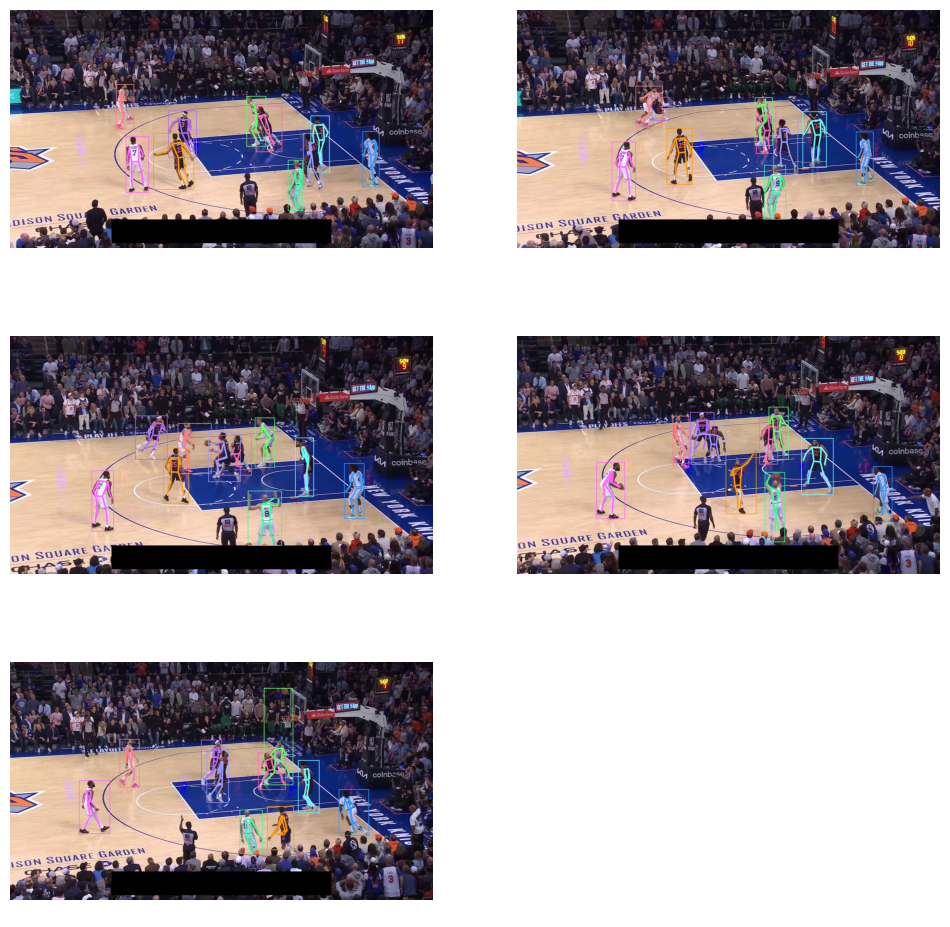

In [ ]:
sv.plot_images_grid(
    images=annotated_frames[:6],
    grid_size=(3, 2)
)

## detect players ankles

In [ ]:
POSE_MODEL = YOLO("yolo11l-pose.pt")
PLAYER_ID = 2
CONFIDENCE_THRESHOLD = 0.3
ANKLE_CONFIDENCE_THRESHOLD = 0.3

IOU_THRESHOLD = 0.7
INTERVAL = 30

box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)

annotated_frames = []

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=CONFIDENCE_THRESHOLD, iou_threshold=IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[detections.class_id == PLAYER_ID]

XYXY = detections.xyxy
CLASS_ID = detections.class_id
TRACKE_ID = list(range(1, len(CLASS_ID) + 1))

detections = sv.Detections(
    xyxy=XYXY,
    tracker_id=np.array(TRACKE_ID)
)


with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.load_first_frame(frame)

    for xyxy, tracker_id in zip(XYXY, TRACKE_ID):
        xyxy = np.array([xyxy])

        _, object_ids, mask_logits = predictor.add_new_prompt(
            frame_idx=0,
            obj_id=tracker_id,
            bbox=xyxy
        )

for index, frame in tqdm(enumerate(frame_generator)):

    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
        crops, boxes, current_tracker_ids = [], [], []
        ankles = {}
        tracker_ids, mask_logits = predictor.track(frame)
        tracker_ids = np.array(tracker_ids)
        masks = (mask_logits > 0.0).cpu().numpy()
        masks = np.squeeze(masks).astype(bool)

        detections = sv.Detections(
            xyxy=sv.mask_to_xyxy(masks=masks),
            mask=masks,
            tracker_id=tracker_ids
        )
        if index % INTERVAL == 0:


            for mask, (x1, y1, x2, y2), tracker_id in zip(
                    detections.mask,
                    detections.xyxy.astype(int),
                    detections.tracker_id
                ):
                region = frame[y1:y2, x1:x2]


                submask = mask[y1:y2, x1:x2]
                crop = np.zeros_like(region)
                crop[submask] = region[submask]

                crops.append(crop)
                boxes.append((x1, y1))
                current_tracker_ids.append(tracker_id)

            if crops:
                results = POSE_MODEL.predict(crops, verbose=False)

                for (box, tracker_id, res) in zip(boxes, current_tracker_ids, results):
                    x1, y1 = box
                    tracker_id = int(tracker_id)

                    # Skip empty detections
                    if res.keypoints is None or res.keypoints.data is None or res.keypoints.data.shape[0] == 0:
                        continue

                    kp_obj = sv.KeyPoints.from_ultralytics(res[0])
                    kp_obj.xy[0]+= np.array([x1, y1])

                    if kp_obj.confidence[0,15] > ANKLE_CONFIDENCE_THRESHOLD and kp_obj.confidence[0][16] > ANKLE_CONFIDENCE_THRESHOLD:

                        # Append ankle positions
                        ankles[tracker_id] = [kp_obj.xy[0][15].tolist(), kp_obj.xy[0][16].tolist()]

                annotated_frame = frame.copy()
                annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
                annotated_frame = plot_ankles(ankles, annotated_frame)
                annotated_frames.append(annotated_frame)

147it [01:02,  2.34it/s]


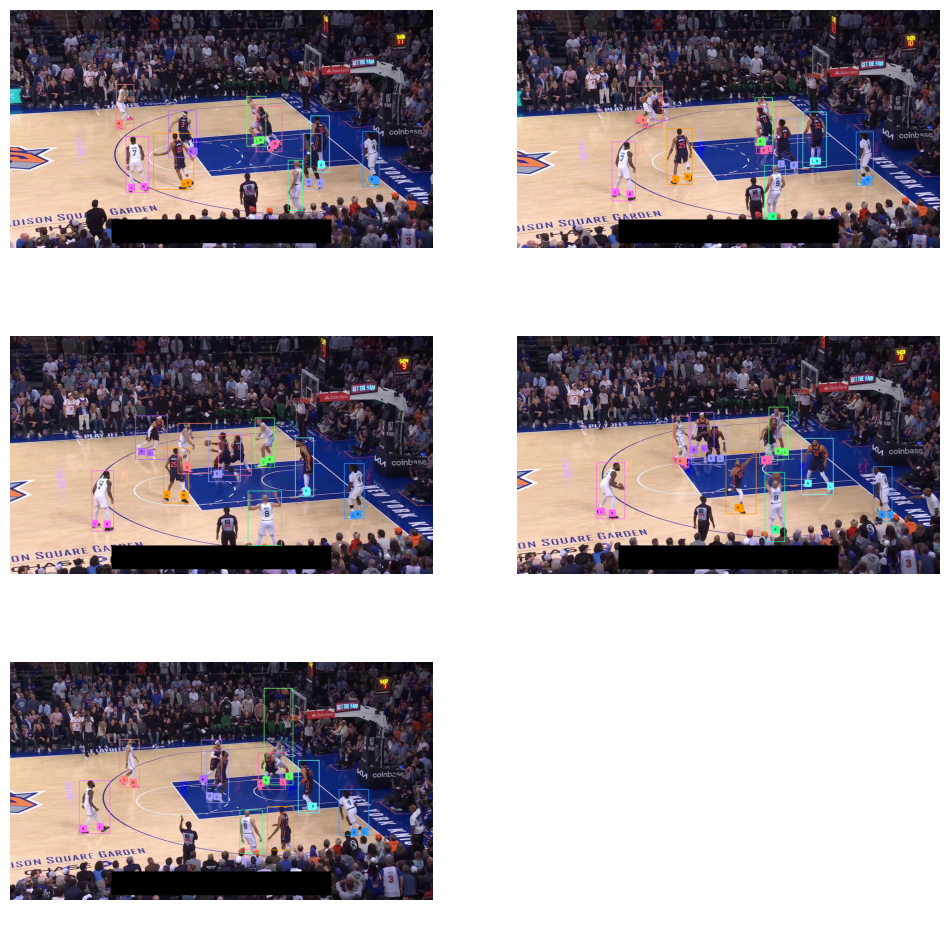

In [ ]:
sv.plot_images_grid(
    images=annotated_frames[:6],
    grid_size=(3, 2)
)

## calculate time in zone

In [ ]:

def run_pose_over_image(frame, detections, conf_threshold=0.5):
    raw_ankles, crops, boxes, tracker_ids = {}, [], [], []
    players_keypoints = {}

    for mask, (x1, y1, x2, y2), tracker_id in zip(
            detections.mask,
            detections.xyxy.astype(int),
            detections.tracker_id
        ):
        region = frame[y1:y2, x1:x2]


        submask = mask[y1:y2, x1:x2]
        crop = np.zeros_like(region)
        crop[submask] = region[submask]

        crops.append(crop)
        boxes.append((x1, y1))
        tracker_ids.append(tracker_id)

    if crops:
        results = POSE_MODEL.predict(crops, verbose=False)
    else:
        return raw_ankles, players_keypoints


    for (box, tracker_id, res) in zip(boxes, tracker_ids, results):
        x1, y1 = box
        tracker_id = int(tracker_id)

        # Skip empty detections
        if res.keypoints is None or res.keypoints.data is None or res.keypoints.data.shape[0] == 0:
            continue

        kp_obj = sv.KeyPoints.from_ultralytics(res[0])
        kp_obj.xy[0]+= np.array([x1, y1])
        players_keypoints[tracker_id] = kp_obj

        if kp_obj.confidence[0,15] > conf_threshold and kp_obj.confidence[0][16] > conf_threshold:

            # Append raw ankle positions
            raw_ankles[tracker_id] = [kp_obj.xy[0][15].tolist(), kp_obj.xy[0][16].tolist()]

    return  raw_ankles, players_keypoints

def players_in_zone_with_ankles(detections: sv.Detections, raw_ankles: dict[List[int]], zone:sv.PolygonZone):
    valid_ids = set()
    for i in range(2): # left and right
        detections_with_ankle = deepcopy(detections)

        for k in raw_ankles: # Use raw_ankles here
            ank = raw_ankles.get(k,None)
            if ank:
                detections_with_ankle.xyxy[detections.tracker_id == k] = [ank[i][0],ank[i][1], ank[i][0],ank[i][1]]

        for index in np.arange(len(detections_with_ankle))[zone.trigger(detections_with_ankle)]:
            valid_ids.add(index)
    return list(valid_ids)

In [ ]:
POSE_MODEL = YOLO("yolo11l-pose.pt")
PLAYER_ID = 2
CONFIDENCE_THRESHOLD = 0.3
ANKLE_CONFIDENCE_THRESHOLD = 0.3

IOU_THRESHOLD = 0.7
INTERVAL = 30

box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)

annotated_frames = []

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=CONFIDENCE_THRESHOLD, iou_threshold=IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[detections.class_id == PLAYER_ID]

XYXY = detections.xyxy
CLASS_ID = detections.class_id
TRACKE_ID = list(range(1, len(CLASS_ID) + 1))

detections = sv.Detections(
    xyxy=XYXY,
    tracker_id=np.array(TRACKE_ID)
)


with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.load_first_frame(frame)

    for xyxy, tracker_id in zip(XYXY, TRACKE_ID):
        xyxy = np.array([xyxy])

        _, object_ids, mask_logits = predictor.add_new_prompt(
            frame_idx=0,
            obj_id=tracker_id,
            bbox=xyxy
        )

for index, frame in tqdm(enumerate(frame_generator)):

    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
        crops, boxes, current_tracker_ids = [], [], []
        ankles = {}
        tracker_ids, mask_logits = predictor.track(frame)
        tracker_ids = np.array(tracker_ids)
        masks = (mask_logits > 0.0).cpu().numpy()
        masks = np.squeeze(masks).astype(bool)

        detections = sv.Detections(
            xyxy=sv.mask_to_xyxy(masks=masks),
            mask=masks,
            tracker_id=tracker_ids
        )
        if index % INTERVAL == 0:


                ankles, players_keypoints = run_pose_over_image(annotated_frame, detections)

                in_zone_indices = players_in_zone_with_ankles(detections, raw_ankles, zone) # Use raw_ankles for zone detection

                detections_in_zone = detections[in_zone_indices]

                time_in_zone = timers[0].tick(detections_in_zone)

                # Add tracker_ids of players currently in the zone to the set
                for tracker_id_in_zone in detections_in_zone.tracker_id:
                    tracked_players_in_zone.add(tracker_id_in_zone)

                # Reset timer for those that are detected outside
                tracker_ids_in_zone = set(detections_in_zone.tracker_id)
                detections_outside_zone = detections[~np.isin(detections.tracker_id, list(tracker_ids_in_zone))]


                for tracker_id_out in detections_outside_zone.tracker_id:
                    if tracker_id_out in tracked_players_in_zone: # Only reset if they were previously in the zone
                        del timers[0].tracker_id2frame_id[int(tracker_id_out)]# = timers[0].frame_id
                        tracked_players_in_zone.remove(tracker_id_out)

                labels = [
                    f"{int(time)}.{int((time - int(time)) * 10)}s"
                    #f"{int(time // 60):02d}:{int(time % 60):02d}"
                    for tracker_id, time in zip(detections_in_zone.tracker_id, time_in_zone)
                ]
                for idx, time in enumerate(time_in_zone):
                    if time % 60 > 3:
                        detections_in_zone.class_id[idx] = 1
                    else:
                        detections_in_zone.class_id[idx] = 0





                annotated_frame = frame.copy()
                annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
                annotated_frame = plot_ankles(ankles, annotated_frame)
                annotated_frames.append(annotated_frame)

# Running the final version

Choose you SAM2 version, the smaller ones use less VRAM

In [ ]:
from sam2.build_sam import build_sam2_camera_predictor

checkpoint = "checkpoints/sam2.1_hiera_large.pt"
config = "configs/sam2.1/sam2.1_hiera_l.yaml"
#checkpoint = "checkpoints/sam2.1_hiera_small.pt"
#config = "configs/sam2.1/sam2.1_hiera_s.yaml"
# checkpoint = "checkpoints/sam2.1_hiera_tiny.pt"
# config = "configs/sam2.1/sam2.1_hiera_t.yaml"
predictor = build_sam2_camera_predictor(config, checkpoint)

Define the Timer

In [ ]:
from typing import Dict

import numpy as np

import supervision as sv

class FPSBasedTimer:
    """
    A timer that calculates the duration each object has been detected based on frames
    per second (FPS).

    Attributes:
        fps (int): The frame rate of the video stream, used to calculate time durations.
        frame_id (int): The current frame number in the sequence.
        tracker_id2frame_id (Dict[int, int]): Maps each tracker's ID to the frame number
            at which it was first detected.
    """

    def __init__(self, fps: int = 30) -> None:
        """Initializes the FPSBasedTimer with the specified frames per second rate.

        Args:
            fps (int): The frame rate of the video stream. Defaults to 30.
        """
        self.fps = fps
        self.frame_id = 0
        self.tracker_id2frame_id: Dict[int, int] = {}

    def tick(self, detections: sv.Detections) -> np.ndarray:
        """Processes the current frame, updating time durations for each tracker.

        Args:
            detections: The detections for the current frame, including tracker IDs.

        Returns:
            np.ndarray: Time durations (in seconds) for each detected tracker, since
                their first detection.
        """
        self.frame_id += 1
        times = []

        for tracker_id in detections.tracker_id:
            self.tracker_id2frame_id.setdefault(tracker_id, self.frame_id)

            start_frame_id = self.tracker_id2frame_id[tracker_id]
            time_duration = (self.frame_id - start_frame_id) / self.fps
            times.append(time_duration)

        return np.array(times)

In [ ]:
from inference import get_model
import torch
import os
from google.colab import userdata

from pathlib import Path
import supervision as sv
from tqdm import tqdm


PLAYER_DETECTION_MODEL_ID = "basketball-player-detection-2/8"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key =  userdata.get("ROBOFLOW_API_KEY"))


COURT_DETECTION_MODEL_ID = "basketball-court-detection-2/10"
COURT_DETECTION_MODEL = get_model(model_id=COURT_DETECTION_MODEL_ID, api_key =  userdata.get("ROBOFLOW_API_KEY"))

## SAM2 tracking and time calculation

In [ ]:
START_PLAYER_ID = 2
END_PLAYER_ID = 8
PLAYER_ID = 2
CONFIDENCE_THRESHOLD = 0.5
IOU_THRESHOLD = 0.7
SAMPLE_INTERVAL = 1
KEYPOINT_CONFIDENCE_THRESHOLD = 0.5

# Use one of the following videos

COLORS_ZONE = sv.ColorPalette.from_hex([
    "#F58426",
])

COLORS_PLAYER = sv.ColorPalette.from_hex([
    "#66ff66", #Green
    sv.Color.RED.as_hex()
])
COLOR = sv.ColorPalette.from_hex([
    "#ffff00",
    "#ff9b00",
    "#ff66ff",
    "#3399ff",
    "#ff66b2",
    "#ff8080",
    "#b266ff",
    "#9999ff",
    "#66ffff",
    "#33ff99",
    "#66ff66",
    "#99ff00"
])

In [ ]:
from shapely.geometry import Point, Polygon
from sports.annotators.basketball import draw_court
from sports.configs.basketball import BasketballCourtConfiguration
from sports.common.view import ViewTransformer

CONFIG = BasketballCourtConfiguration()

In [ ]:
left_paint = [2, 9, 10, 11, 3, 2] #Indices to keypoint list
right_paint = [21, 23, 30, 29] #Indices to keypoint list

edge_annotator_kp = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2, edges=[(p1 + 1, p2 + 1) for p1, p2 in CONFIG.edges])
vertex_annotator_reference_kp = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)
vertex_annotator_kp = sv.VertexAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    radius=8)

def initial_player_detections(PLAYER_DETECTION_MODEL, box_annotator, label_annotator,frame,
                              CONFIDENCE_THRESHOLD, IOU_THRESHOLD,
                              START_PLAYER_ID, END_PLAYER_ID, PLAYER_ID):


    result_players = PLAYER_DETECTION_MODEL.infer(frame, verbose=False, CONFIDENCE_THRESHOLD = 0.5,
                                                  iou_threshold=IOU_THRESHOLD)[0]
    detections = sv.Detections.from_inference(result_players)


    detections = detections[(detections.class_id == PLAYER_ID)]

    xyxy = detections.xyxy
    class_id = detections.class_id
    tracker_id = np.arange(1, len(class_id) + 1)

    labels = [str(tracker_id_) for tracker_id_ in tracker_id]
    detections.tracker_id = tracker_id
    annotated_frame = frame.copy()
    annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
    sv.plot_image(annotated_frame)
    return xyxy, tracker_id, class_id


def find_active_zone(COURT_DETECTION_MODEL, frame, KEYPOINT_CONFIDENCE_THRESHOLD, plot_keypoints = False ):
    result = COURT_DETECTION_MODEL.infer(frame)[0]
    keypoints = sv.KeyPoints.from_inference(result)

    if keypoints is None or keypoints.confidence is None or len(keypoints.confidence) == 0:
        return None, None, None

    mask = keypoints.confidence[0]<KEYPOINT_CONFIDENCE_THRESHOLD
    filter = ~mask

    keypoints.xy[0][mask] = keypoints.xy[0][mask] * 0
    polygons_indices = [left_paint,right_paint]
    zone = None
    for i,indices in enumerate(polygons_indices):
        if np.count_nonzero(keypoints.xy[0][indices])  < 5 : #there arent 2 keypoints at least
            continue
        frame_reference_points = keypoints.xy[0][filter]
        court_reference_points = np.array(CONFIG.vertices)[filter]

        transformer = ViewTransformer(
            source=court_reference_points,
            target=frame_reference_points
        )

        court_all_points = np.array(CONFIG.vertices)

        frame_all_points = transformer.transform_points(points=court_all_points)


        paint = frame_all_points[indices].astype(int)

        polygon = keypoints.xy[0][indices]
        polygon[polygon== 0] = paint[polygon== 0]
        paint_zone = sv.PolygonZone(
          polygon=polygon,
          triggering_anchors=(sv.Position.BOTTOM_CENTER,),
          )

        if plot_keypoints:

            frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])
            frame_reference_key_points = sv.KeyPoints(
                xy=frame_reference_points[np.newaxis, ...])
            frame = edge_annotator_kp.annotate(
                scene=frame,
                key_points=frame_all_key_points)
            frame = vertex_annotator_kp.annotate(
                scene=frame,
                key_points=frame_all_key_points)
            frame = vertex_annotator_reference_kp.annotate(
                scene=frame,
                key_points=frame_reference_key_points)
        return paint_zone, keypoints, indices
    return None, None,None

## Mask cleaning

In [ ]:
import numpy.typing as npt

def remove_noisy_segments(
    mask: npt.NDArray[np.bool_],
    connectivity: int = 8,
    area_threshold: int = 700,
    distance_threshold: float = 70.0,
) -> npt.NDArray[np.bool_]:
    """
    Removes connected components small and spatially distant from the largest connected component
    out of a binary mask. Component area is penalized more the farther it is from the largest component centroid,
    removing larger components that are far away from the threshold.

    Args:
        mask (npt.NDArray[np.bool_]): A 2D boolean or binary mask, where 0 indicates background
            and 1 indicates foreground.
        connectivity (int): Connectivity for connected components analysis. Can either be 4 or 8, default is 8.
            When the value is 4, each pixel connects only to its horizontal and vertical neighbors:
              Up, Down, Left, Right.
            When the value is 8, each pixel connects to its horizontal, vertical, and diagonal neighbors,
              being more permisive to what is considered a connected component.
        area_threshold (int): Minimum area in pixels required to keep a non largest component.
            If the component's area is smaller than this value, it will be considered for the
            distance evaluation. When the component is farther than the 'distance_threshold'
            parameter, the area threshold is scaled up linearly with the distance from the
            main component's centroid, so that larger components are removed when distance grows.
        distance_threshold (float): Maximum distance in pixels from the main component's centroid
            to keep a component.
            If the distance from the main component's centroid is larger than this value, then
            the algorithm will check the area and if it is smaller than the 'area_threshold',
            the component will be considered an outlier and removed.
            Distance is calculated as the Euclidean distance between the component's centroid and the main
            component's centroid.

    Returns:
        np.ndarray: A cleaned binary mask with outlier components removed.

        ```python
        import numpy as np
        import supervision as sv

        mask = np.array([
            [1, 1, 1, 1, 0, 0],
            [0, 0, 0, 0, 0, 0],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 1, 0, 1, 1],
            [0, 0, 0, 0, 0, 0],
            [0, 1, 1, 1, 0, 0],
            [0, 1, 1, 1, 0, 0]
        ]).astype(bool)

        sv.remove_noisy_segments(mask=mask, connectivity=4, area_threshold = 4, distance_threshold = 4)
        # np.array([
        #     [0, 0, 0, 0, 0, 0],
        #     [0, 0, 0, 0, 0, 0],
        #     [1, 0, 0, 0, 1, 1],
        #     [0, 1, 1, 0, 1, 1],
        #     [0, 0, 0, 0, 0, 0],
        #     [0, 1, 1, 1, 0, 0],
        #     [0, 1, 1, 1, 0, 0]
        # ])

    """
    if connectivity != 4 and connectivity != 8:
        raise ValueError(
            "Incorrect connectivity value. Possible connectivity values: 4 or 8."
        )
    mask_uint8 = (mask > 0).astype(np.uint8)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
        mask_uint8, connectivity=connectivity
    )

    if num_labels <= 1:
        return np.zeros_like(mask, dtype=bool)

    # Identify main (largest) component excluding background (label 0)
    areas = stats[1:, cv2.CC_STAT_AREA]

    if not areas.size:
        # input mask contains no foreground pixels
        return np.zeros_like(mask, dtype=bool)
    largest_idx = 1 + np.argmax(areas)
    main_centroid = centroids[largest_idx]

    # Start with an empty output mask
    cleaned_mask = np.zeros_like(mask, dtype=bool)
    for i in range(1, num_labels):  # skip background
        area = stats[i, cv2.CC_STAT_AREA]
        centroid = centroids[i]

        dist = np.linalg.norm(centroid - main_centroid)

        # Increase area threshold proportionally with distance from main component
        if (
            dist > distance_threshold
            and area < area_threshold * dist / distance_threshold
        ):
            continue

        # Keep component
        cleaned_mask[labels == i] = True

    return cleaned_mask

## Pose Estimation utils

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np
from copy import deepcopy
from typing import List, Dict
from collections import deque

POSE_MODEL = YOLO("yolo11l-pose.pt")


CUSTOM_12_VERTEX_SKELETON_EDGES = CUSTOM_12_VERTEX_SKELETON_EDGES = [
    [11, 9],
    [9, 7],
    [12, 10],
    [10, 8],
    [7, 8],
    [1, 7],
    [2, 8],
    [1, 2],
    [1, 3],
    [2, 4],
    [3, 5],
    [4, 6],
]

class AnkleSmoother:
    def __init__(self, window_size: int ):
        self.window_size = window_size
        self.ankle_history: Dict[int, deque] = {}

    def update(self, tracker_id: int, ankle_position: List[float]) -> List[float]:
        if tracker_id not in self.ankle_history:
            self.ankle_history[tracker_id] = deque(maxlen=self.window_size)

        self.ankle_history[tracker_id].append(ankle_position)

        if len(self.ankle_history[tracker_id]) == 0:
            return []

        # Calculate the weighted mean of the ankle positions in the window
        history = list(self.ankle_history[tracker_id])
        smoothed_ankle = np.mean(history, axis=0)
        return smoothed_ankle.tolist()


    def drop_oldest(self, tracker_id: int):
        """
        Drops the oldest ankle position from the history for a given tracker ID.
        """
        if tracker_id in self.ankle_history and len(self.ankle_history[tracker_id]) > 0:
            self.ankle_history[tracker_id].popleft()


    def reset(self, tracker_id: int):
        if tracker_id in self.ankle_history:
            del self.ankle_history[tracker_id]


def run_pose_over_image(frame, detections, ankle_smoother: AnkleSmoother, conf_threshold=0.5):

    raw_ankles, smoothed_ankles, crops, boxes, tracker_ids = {}, {}, [], [], []
    players_keypoints ={} #
    # Step 1: Prepare crops, boxes, and tids
    for mask, (x1, y1, x2, y2), tracker_id in zip(
            detections.mask,
            detections.xyxy.astype(int),
            detections.tracker_id
        ):
        region = frame[y1:y2, x1:x2]
        if region.size == 0:
            ankle_smoother.drop_oldest(int(tracker_id))
            continue

        submask = mask[y1:y2, x1:x2]
        crop = np.zeros_like(region)
        crop[submask] = region[submask]

        crops.append(crop)
        boxes.append((x1, y1))
        tracker_ids.append(tracker_id)

    if crops:
        results = POSE_MODEL.predict(crops, verbose=False)
    else:
        # If no crops, it means no players were detected, so drop oldest for all tracked players
        for tracker_id in ankle_smoother.ankle_history.keys():
             ankle_smoother.drop_oldest(int(tracker_id))
        return raw_ankles, smoothed_ankles, players_keypoints


    for (box, tracker_id, res) in zip(boxes, tracker_ids, results):
        x1, y1 = box
        tracker_id = int(tracker_id)

        # Skip empty detections
        if res.keypoints is None or res.keypoints.data is None or res.keypoints.data.shape[0] == 0:
            ankle_smoother.drop_oldest(tracker_id)
            continue

        kp_obj = sv.KeyPoints.from_ultralytics(res[0])
        kp_obj.xy[0]+= np.array([x1, y1])

        if kp_obj.confidence[0,15] > conf_threshold and kp_obj.confidence[0][16] > conf_threshold:
            players_keypoints[tracker_id] = kp_obj #only add keypoiints if ankles are detected

            # Append raw ankle positions
            raw_ankles[tracker_id] = [kp_obj.xy[0][15].tolist(), kp_obj.xy[0][16].tolist()]

            # Smooth ankle positions
            smoothed_left_ankle = ankle_smoother.update((tracker_id, "L"), kp_obj.xy[0][15].tolist())
            smoothed_right_ankle = ankle_smoother.update((tracker_id, "R"), kp_obj.xy[0][16].tolist())
            smoothed_ankles[tracker_id] = [smoothed_left_ankle, smoothed_right_ankle]
        else:
            ankle_smoother.drop_oldest(tracker_id)

    return  raw_ankles, smoothed_ankles, players_keypoints

def players_in_zone_with_ankles(detections: sv.Detections, raw_ankles: dict[List[int]], zone:sv.PolygonZone):
    valid_ids = set()
    for i in range(2): # left and right
        detections_with_ankle = deepcopy(detections)

        for k in raw_ankles: # Use raw_ankles here
            ank = raw_ankles.get(k,None)
            if ank:
                detections_with_ankle.xyxy[detections.tracker_id == k] = [ank[i][0],ank[i][1], ank[i][0],ank[i][1]]

        for index in np.arange(len(detections_with_ankle))[zone.trigger(detections_with_ankle)]:
            valid_ids.add(index)
    return list(valid_ids)

def plot_poses(players_keypoints: dict, frame):
    for tracker_id in players_keypoints.keys():
        new_kp_obj = sv.KeyPoints(xy=players_keypoints[tracker_id].xy[:, 5:], confidence=players_keypoints[tracker_id].confidence[:, 5:])
        annotator = sv.EdgeAnnotator(color=COLOR.by_idx(tracker_id), thickness=5,
                                     edges=CUSTOM_12_VERTEX_SKELETON_EDGES)
        frame = annotator.annotate(scene=frame, key_points=new_kp_obj)

    return frame

def plot_ankles(players_keypoints, smoothed_ankles, frame): # Modified to use smoothed_ankles
    for i, tracker_id in enumerate(players_keypoints.keys()):
        if smoothed_ankles and smoothed_ankles[tracker_id]:
            smoothed_kp_obj = sv.KeyPoints(xy=np.array([smoothed_ankles[tracker_id][0], smoothed_ankles[tracker_id][1]])[np.newaxis, ...])
            vertex_label_annotator = sv.VertexLabelAnnotator(
                color=COLOR.by_idx(tracker_id),
                text_color=sv.Color.BLACK,
                border_radius=2
            )
            frame = vertex_label_annotator.annotate(
                scene=frame,
                key_points=smoothed_kp_obj,
                labels=["L", "R"]
            )
    return frame

## Visualization utils

In [ ]:
import cv2
def to_grayscale(image: np.ndarray) -> np.ndarray:
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
def polygon_to_mask(polygon: np.ndarray, frame_shape: tuple) -> np.ndarray:
    """
    Generates a binary mask from a polygon over a frame.

    Parameters:
    - polygon: np.ndarray of shape (N, 2), where N is the number of vertices (x, y)
    - frame_shape: tuple (height, width) of the frame

    Returns:
    - mask: np.ndarray of shape (height, width), dtype=bool
    """

    height, width = frame_shape
    mask = np.zeros((height, width), dtype=np.uint8)

    # Ensure polygon is in the format OpenCV expects
    polygon_int = polygon.astype(np.int32).reshape((-1, 1, 2))

    cv2.fillPoly(mask, [polygon_int], color=1)
    return mask.astype(bool)

def override_frame(frame, other_frame, detections):
    #  Blend grayscale player regions (in zone only)
    for i, mask in enumerate(detections.mask):
        # Ensure mask is 2D boolean
        if mask.ndim == 3:
            mask = np.squeeze(mask)
        if mask.dtype != bool:
            mask = mask.astype(bool)

        # Broadcast mask to 3 channels
        mask_3ch = np.repeat(mask[:, :, None], 3, axis=2)

        # Copy grayscale pixels into the original frame where mask is True
        frame[ mask_3ch] = other_frame[mask_3ch]



### Define annotators

In [ ]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2,
                                color_lookup=sv.ColorLookup.TRACK,)

label_annotator = sv.LabelAnnotator(color=COLORS_PLAYER, text_color=sv.Color.BLACK,
                                    text_scale=1.2,color_lookup= sv.ColorLookup.CLASS,
                                    text_position = sv.Position.BOTTOM_LEFT)
track_mask_annotator = sv.MaskAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    opacity=0.7)

mask_annotator = sv.MaskAnnotator(
    color=COLORS_PLAYER,
    color_lookup=sv.ColorLookup.CLASS,
    opacity=0.7)

halo_annotator = sv.HaloAnnotator(
    color=sv.Color.WHITE,
    color_lookup=sv.ColorLookup.INDEX,
    opacity=0.7,
)
zone_annotator = sv.MaskAnnotator(color=COLORS_ZONE.by_idx(0), opacity=0.6, color_lookup=sv.ColorLookup.INDEX) # Added zone_annotator

## Run 3 second violation detection

In [ ]:
def main(SOURCE_VIDEO_PATH, filter_noisy_segments = True,):

    TARGET_VIDEO = f"{Path(SOURCE_VIDEO_PATH).stem}-3-second-rule.mp4"

    video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)

    timers = [FPSBasedTimer(video_info.fps / SAMPLE_INTERVAL ) ]
    frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, stride=SAMPLE_INTERVAL)
    frame = next(frame_generator)

    ankle_smoother = AnkleSmoother(window_size=3)

    tracked_players_in_zone = set()

    xyxy, tracker_id, class_id = initial_player_detections(PLAYER_DETECTION_MODEL, box_annotator, label_annotator, frame,
                                  CONFIDENCE_THRESHOLD, IOU_THRESHOLD,
                                  START_PLAYER_ID, END_PLAYER_ID, PLAYER_ID)

    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
        predictor.load_first_frame(frame)

        for xyxy_, tracker_id_ in zip(xyxy, tracker_id):
            xyxy_ = np.array([xyxy_])
            tracker_id_ = int(tracker_id_)
            _, object_ids, mask_logits = predictor.add_new_prompt(
                frame_idx=0,
                obj_id=tracker_id_,
                bbox=xyxy_
            )

    TARGET_ANKLES = TARGET_VIDEO.replace(".mp4", "_ankles.mp4")
    TARGET_PLAYER_MASKS = TARGET_VIDEO.replace(".mp4", "_player_masks.mp4")
    TARGET_KEYPOINT_DETECTION= TARGET_VIDEO.replace(".mp4", "_keypoint_detection.mp4")
    TARGET_IN_ZONE_CRITERIA= TARGET_VIDEO.replace(".mp4", "_in_zone_criteria.mp4")

    with sv.VideoSink(TARGET_VIDEO, video_info=video_info) as sink, \
        sv.VideoSink(TARGET_ANKLES, video_info) as sink_ankles , \
        sv.VideoSink(TARGET_PLAYER_MASKS, video_info) as sink_player_masks , \
        sv.VideoSink(TARGET_IN_ZONE_CRITERIA, video_info) as sink_in_zone_criteria , \
        sv.VideoSink(TARGET_KEYPOINT_DETECTION, video_info) as sink_court_keypoints:
        for frame in tqdm(frame_generator):
            # Initialize annotated_frame with a copy of the current frame
            annotated_frame = frame.copy()
            annotated_frame_ankles = frame.copy()
            annotated_frame_players_track = frame.copy()
            annotated_frame_keypoints = frame.copy()

            with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
                object_ids, mask_logits = predictor.track(frame)
                masks = (mask_logits > 0.0).cpu().numpy()
                masks = np.squeeze(masks).astype(bool)

                detections = sv.Detections(
                    xyxy=sv.mask_to_xyxy(masks=masks),
                    mask=masks,
                    class_id=class_id[np.array(object_ids) - 1],
                    tracker_id=np.array(object_ids)
                )

                # doing 1 zone only, because there will not be a scenario where we need to see both at a time
                zone,keypoints, zone_indices = find_active_zone(COURT_DETECTION_MODEL,annotated_frame_keypoints,
                                  KEYPOINT_CONFIDENCE_THRESHOLD = KEYPOINT_CONFIDENCE_THRESHOLD, plot_keypoints=True )
                if zone is None:
                    continue

                raw_ankles, smoothed_ankles, players_keypoints = run_pose_over_image(annotated_frame, detections, ankle_smoother)
                in_zone_indices = players_in_zone_with_ankles(detections, raw_ankles, zone) # Use raw_ankles for zone detection

                detections_in_zone = detections[in_zone_indices]

                time_in_zone = timers[0].tick(detections_in_zone)

                # Add tracker_ids of players currently in the zone to the set
                for tracker_id_in_zone in detections_in_zone.tracker_id:
                    tracked_players_in_zone.add(tracker_id_in_zone)

                # Reset timer for those that are detected outside
                tracker_ids_in_zone = set(detections_in_zone.tracker_id)
                detections_outside_zone = detections[~np.isin(detections.tracker_id, list(tracker_ids_in_zone))]


                for tracker_id_out in detections_outside_zone.tracker_id:
                    if tracker_id_out in tracked_players_in_zone: # Only reset if they were previously in the zone
                        del timers[0].tracker_id2frame_id[int(tracker_id_out)]# = timers[0].frame_id
                        tracked_players_in_zone.remove(tracker_id_out)

                labels = [
                    f"{int(time)}.{int((time - int(time)) * 10)}s"
                    #f"{int(time // 60):02d}:{int(time % 60):02d}"
                    for tracker_id, time in zip(detections_in_zone.tracker_id, time_in_zone)
                ]
                for idx, time in enumerate(time_in_zone):
                    if time % 60 > 3:
                        detections_in_zone.class_id[idx] = 1
                    else:
                        detections_in_zone.class_id[idx] = 0

                # Create a copy of the frame for annotation
                gray_frame = to_grayscale(frame)

                # Apply grayscale to the background where objects are not detected
                annotated_frame[~detections.mask.any(axis=0)] = gray_frame[~detections.mask.any(axis=0)]

                zone_mask = polygon_to_mask(zone.polygon, frame.shape[:2])
                zone_xyxy = sv.mask_to_xyxy(masks=np.array([zone_mask]))

                # Annotate the zone
                annotated_frame = zone_annotator.annotate(
                    scene=annotated_frame, detections=sv.Detections(xyxy=zone_xyxy,
                                                                    mask=np.array([zone_mask]),
                                                                    class_id = np.array([0]))) # Draw filled zone

                # Draw zone polygon outline
                annotated_frame = sv.draw_polygon(
                    scene=annotated_frame, polygon=zone.polygon, color=COLORS_ZONE.by_idx(0)
                )

                if filter_noisy_segments:
                    detections.mask = np.array([
                        remove_noisy_segments(mask) for mask in masks
                    ])
                    detections.xyxy = sv.mask_to_xyxy(masks= detections.mask )
                    detections_in_zone.mask = detections[in_zone_indices].mask
                    detections_in_zone.xyxy = sv.mask_to_xyxy(masks= detections_in_zone.mask )

                override_frame(annotated_frame, gray_frame, detections)
                annotated_frame_in_zone_criteria= annotated_frame.copy()

                # Annotate masks for players in the zone
                annotated_frame = mask_annotator.annotate(scene=annotated_frame, detections=detections_in_zone)

                # Annotate labels for players in the zone
                annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections_in_zone, labels=labels)
                #plot_poses(players_keypoints, annotated_frame)

                # Annotate halos for all detected players
                annotated_frame = halo_annotator.annotate(scene=annotated_frame, detections=detections)

                # Annotate ankles and bbox in ankles video
                annotated_frame_ankles = plot_ankles(players_keypoints, smoothed_ankles, annotated_frame_ankles) # Use smoothed_ankles for visualization

                annotated_frame_ankles = box_annotator.annotate(scene=annotated_frame_ankles, detections=detections)

                # Annotate ankles and bbox in detection criteria video

                override_frame(annotated_frame_in_zone_criteria, frame, detections_in_zone)
                annotated_frame_in_zone_criteria = plot_ankles(players_keypoints, smoothed_ankles, annotated_frame_in_zone_criteria) # Use smoothed_ankles for visualization
                annotated_frame_in_zone_criteria = box_annotator.annotate(scene=annotated_frame_in_zone_criteria, detections=detections)

                # Annotate players track
                annotated_frame_players_track = track_mask_annotator.annotate(scene=annotated_frame_players_track, detections=detections)

                # Plot and save video frames

                sv.plot_image(annotated_frame_keypoints)
                sv.plot_image(annotated_frame)
                sv.plot_image(annotated_frame_ankles)
                sv.plot_image(annotated_frame_players_track)
                sv.plot_image(annotated_frame_in_zone_criteria)



                sink.write_frame(annotated_frame)
                sink_ankles.write_frame(annotated_frame_ankles)
                sink_player_masks.write_frame(annotated_frame_players_track)
                sink_court_keypoints.write_frame(annotated_frame_keypoints)
                sink_in_zone_criteria.write_frame(annotated_frame_in_zone_criteria)

## Run it

Download the provided video or add yours modifying SOURCE_VIDEO_PATH

In [ ]:
!gdown https://drive.google.com/uc?id=1EsxiyaYGj3FeXSXoK51pre5OjVGWTCSE -O "/content/basketball_video.mp4"

SOURCE_VIDEO_PATH = "/content/basketball_video.mp4"

In [ ]:
main(SOURCE_VIDEO_PATH,filter_noisy_segments = True)

In [ ]:
#Compress the video for display in Google Colab
%%capture
!ffmpeg -y -i {TARGET_VIDEO.replace(".mp4", "_ankles.mp4")} -vcodec libx264 -crf 28 "/content/compressed.mp4"

In [ ]:
from IPython.display import Video

Video("/content/compressed.mp4", embed=True,width = 850)

In [ ]:
#Compress the video for display in Google Colab
%%capture
!ffmpeg -y -i {TARGET_VIDEO} -vcodec libx264 -crf 28 "/content/compressed.mp4"

In [ ]:
from IPython.display import Video

Video("/content/compressed.mp4", embed=True,width = 850)